_Aprendizaje Automático_

_Máster Universitario en Inteligencia Artificial_

# Laboratorio: Regresión lineal y árboles de decisión para tareas de regresión


## Objetivos

Mediante esta actividad se pretende que ponga en práctica los pasos para la resolución de un problema de machine learning, el tratamiento de datos y la creación de modelos basados en regresión lineal y árboles de decisión. El objetivo es comprender de forma práctica con un problema determinado las diferencias que existen a la hora de entrenar los diferentes modelos.

- Iniciarse en el Análisis Exploratorio de Datos (EDA) para los problemas de Machine Learning.
- Entender y aplicar los conceptos de la Regresión Lineal Múltiple a un problema de regresión.
- Entender y aplicar los conceptos de Árboles de Decisión a un problema de regresión.
- Evaluar y analizar los resultados de los regresores.
- Investigar la aplicación de los modelos de regresión a problemas reales.


## Descripción de la actividad

Debes completar los espacios indicados en el notebook con el código solicitado y la respuesta, en función de lo que se solicite. Ten encuenta que las celdas vacías indican cuántas líneas debe ocupar la respuesta, por lo general no más de una línea.

El conjunto de datos con el que vamos a trabajar se encuentra en el siguiente enlace: https://archive.ics.uci.edu/dataset/360/air+quality

Se trata de un dataset con un conjunto de datos sobre calidad del aire. El conjunto de datos contiene 9358 instancias de respuestas promediadas por hora de una matriz de 5 sensores químicos de óxido de metal integrados en un dispositivo multisensor químico de calidad del aire. El dispositivo estaba ubicado en un área significativamente contaminada, al nivel de la carretera, dentro de una ciudad italiana. Los datos se registraron desde marzo de 2004 hasta febrero de 2005 (un año).

El objetivo de la regresión será predecir la calidad del aire para un determinado día.

### Tareas que se deben realizar

- Análisis descriptivo de los datos:
   - Debe completarse el código solicitado y responder a las preguntas. Todo ello en el notebook dado como base.
- Regresión:
  - Debe completarse el código solicitado y responder a las preguntas. Todo ello en el notebook dado como base.
- Investigación:
  - Buscar un artículo científico (https://scholar.google.es/) con un caso de uso de regresión empleando una de las dos técnicas (o ambas) vistas en la actividad. Los artículos deben estar en revistas científicas, y deben ser posteriores a 2015. No debe utilizar técnicas de Deep Learning.
  - Para el artículo indicar:
    - Objetivo: cuál es el objetivo de la investigación, es decir a qué problema real está aplicando la regresión.
    - Cómo utilizan las técnicas de regresión, si realizan alguna adaptación de los algoritmos indicarse.
    - Principales resultados de la aplicación y de la investigación.


### Análisis descriptivo de los datos
A continuación vas a encontrar una serie de preguntas que tendrás que responder. Para responder tendrás que escribir (y ejecutar) una (o más de una) línea de código, y a continuación indicar la respuesta en la celda indicada.

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ucimlrepo import fetch_ucirepo 
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

In [67]:
# fetch dataset 
air_quality = fetch_ucirepo(id=360) 
  
# data (as pandas dataframes) 
X = air_quality.data.features 
y = air_quality.data.targets 
  
# metadata 
print(air_quality.metadata) 
  
# variable information 
print(air_quality.variables) 

{'uci_id': 360, 'name': 'Air Quality', 'repository_url': 'https://archive.ics.uci.edu/dataset/360/air+quality', 'data_url': 'https://archive.ics.uci.edu/static/public/360/data.csv', 'abstract': 'Contains the responses of a gas multisensor device deployed on the field in an Italian city. Hourly responses averages are recorded along with gas concentrations references from a certified analyzer. ', 'area': 'Computer Science', 'tasks': ['Regression'], 'characteristics': ['Multivariate', 'Time-Series'], 'num_instances': 9358, 'num_features': 15, 'feature_types': ['Real'], 'demographics': [], 'target_col': None, 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2008, 'last_updated': 'Sun Mar 10 2024', 'dataset_doi': '10.24432/C59K5F', 'creators': ['Saverio Vito'], 'intro_paper': {'ID': 420, 'type': 'NATIVE', 'title': 'On field calibration of an electronic nose for benzene estimation in an urban pollution monitoring scenario', 'authors': 

In [68]:
X['Date'] = pd.to_datetime(X['Date'], format='%m/%d/%Y', errors='coerce')
X['Time'] = pd.to_datetime(X['Time'], format='%H:%M:%S', errors='coerce').dt.time
X = X.drop_duplicates()

Se ha convertido la columna **Date** a formato datatime utilizando el formato '%m/%d/%Y'. Además, se le ha hecho lo mismo con la columna **Time**, utilizando el formato '%H:%M:%S'. Posteriormente se eliminaron los duplicados, ya que, en este caso no tiene sentido tener dos registros idénticos para la misma fecha y hora, ya que eso indicaría una inconsistencia en los datos. 

En caso de haber alguna columna extra como **Unnamed**, sería recomendable eliminarlas antes de los duplicados, porque si no puede interferir en el proceso de eliminación de duplicados, al tener estas columnas valores únicos, realizando una errónea eliminación de duplicados. 

In [69]:
X.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360,150,11.9,1046,166,1056,113,1692,1268,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292,112,9.4,955,103,1174,92,1559,972,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402,88,9.0,939,131,1140,114,1555,1074,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376,80,9.2,948,172,1092,122,1584,1203,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272,51,6.5,836,131,1205,116,1490,1110,11.2,59.6,0.7888


Se ha utilizado el método head() para visualizar las primeras filas del conjunto de datos y así verificar que los valores han sido correctamente leídos. Permitiendo una inspección rápida, además de comprobar que las columnas **Date** y **Time** se han convertido a sus formatos adecuadamente.

In [70]:
## ¿cuántas instancias tiene el dataset?
num_instancias = X.shape[0]

El dataset tiene 9357 instancias.

In [71]:
## ¿cuál es el tipo de datos de cada una de las columnas?
types_dates = X.dtypes

El tipo de datos de cada una de las columnas son los siguientes:

| Column | Data Type |
|--------|-----------|
| Date | datetime64[ns] |
| Time | object |
| CO(GT) | float64 |
| PT08.S1(CO) | int64 |
| NMHC(GT) | int64 |
| C6H6(GT) | float64 |
| PT08.S2(NMHC) | int64 |
| NOx(GT) | int64 |
| PT08.S3(NOx) | int64 |
| NO2(GT) | int64 |
| PT08.S4(NO2) | int64 |
| PT08.S5(O3) | int64 |
| T | float64 |
| RH | float64 |
| AH | float64 |

In [72]:
## ¿cuántas columnas categóricas hay? ¿y cuántas continuas?
X.describe()

,Date,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2004-09-21 04:30:05.193972480,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604
min,2004-03-10 00:00:00,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,2004-06-16 00:00:00,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300
50%,2004-09-21 00:00:00,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800
75%,2004-12-28 00:00:00,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200
max,2005-04-04 00:00:00,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000
std,NaN,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670


En el análisis de las columnas del dataset, se pueden identificar dos tipos de variables: continuas y categóricas. Las columnas **Date** y **Time** son consideradas categóricas. Ambas representan momentos específicos en el tiempo. Aunque estén representadas como fechas, las interpretamos como variables que describen un instante o una categoría temporal. A pesar de que **Time** podría ser interpretada como una unidad temporal (por ejemplo, una hora o minuto), sigue representando un momento único en el tiempo. Si se extrajeran los componentes individuales de ambas, esos componentes podrían clasificarse como variables numéricas, pero en su forma actual, se tratan como variables categóricas. Además, las horas y las fechas son finitas. 

Las otras columnas, como **CO(GT)**, **T**, **NO2(GT)**, etc., son continuas porque son valores numéricos que pueden tomar cualquier valor dentro de un rango. Los datos de estas variables son **float64** e **int64**, lo que indica que se pueden tomar una amplia gama de valores dentro de un rango específico. A pesar de que algunas de estas variables, como **CO** o **NOx**, tienen restringidos los valores por las características de los sensores, los tratamos como variables continuas debido a tener un conjunto finito de valores. (variable discreta).

Por lo tanto, en este caso se han identificado dos variables categóricas y trece variables continuas. 

In [73]:
## ¿existen valores nulos en el dataset?
val_nan = X.replace(-200, np.nan)
null_values = val_nan.isnull().sum().sum()

En el dataset hay 16701 valores nulos. 

Dichos valores están etiquetados como -200. Se ha remplazado esta etiqueta por NaN (Not a Number) para facilitar la identificación y el manejo de los valores nulos. 

Se identificó y manejo los valores fuera de los rangos permitidos definidos para ciertas variables del dataset, de acuerdo con las características de los sensores descritas en el paper asociado al dataset. Para cada columna, los valores que no cumplen con los rangos establecidos se remplazaron por valores Nan. Permitiendo quedarnos con valores válidos para el entorno de estudio, reduciendo el impacto de datos erróneos en la medición de los resultados. Además, se analizó la proporción de valores fuera del rango en cada variable para evaluar su impacto, el cual es pequeño. 

In [74]:
ranges = {
    'CO(GT)': (0.1, 100),
    'NOx(GT)': (20, 1000),
    'NO2(GT)': (20, 1000),
    'T': (-20, 50), 
    'RH': (10, 90), 
    'AH': (0, 30) 
}

In [75]:
proporcion_fuera_del_rango = {}

for column, (min_val, max_val) in ranges.items():
    if column in val_nan.columns: 
        fuera_del_rango = ((val_nan[column] < min_val) | (val_nan[column] > max_val)).sum()
        total_valores = val_nan[column].notna().sum()  
        proporcion = fuera_del_rango / total_valores if total_valores != 0 else 0
        proporcion_fuera_del_rango[column] = proporcion

for column, proporcion in proporcion_fuera_del_rango.items():
    print(f"Columna: {column} - Proporción fuera del rango: {proporcion:.4f}")

Columna: CO(GT) - Proporción fuera del rango: 0.0000
Columna: NOx(GT) - Proporción fuera del rango: 0.0203
Columna: NO2(GT) - Proporción fuera del rango: 0.0041
Columna: T - Proporción fuera del rango: 0.0000
Columna: RH - Proporción fuera del rango: 0.0008
Columna: AH - Proporción fuera del rango: 0.0000


In [76]:
for column, (min_val, max_val) in ranges.items():
    if column in val_nan.columns: 
        val_nan[column] = val_nan[column].where((val_nan[column] >= min_val) & (val_nan[column] <= max_val), np.nan)

In [77]:
## ¿cuál es la variable respuesta?¿de qué tipo es?
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   int64         
 4   NMHC(GT)       9357 non-null   int64         
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   int64         
 7   NOx(GT)        9357 non-null   int64         
 8   PT08.S3(NOx)   9357 non-null   int64         
 9   NO2(GT)        9357 non-null   int64         
 10  PT08.S4(NO2)   9357 non-null   int64         
 11  PT08.S5(O3)    9357 non-null   int64         
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
dtypes: datetime64[ns](1),

La variable respuesta elegida para el análisis es **benceno (C6H6(GT))**, ya que cumple con varias características que la hacen adecuada para este propósito. En primer lugar, el objetivo del estudio es predecir un valor numérico, no clasificar en categorías, lo que implica que la variable de interés debe ser continua. En este caso, **C6H6(GT)** es una variable numérica y continua, medida en microg/m³. 

El benceno, además, es un compuesto químico significativo en estudios de calidad del aire, ya que es un contaminante tóxico relacionado con diversas fuentes industriales y de los vehículos. El paper del dataset menciona que no existe un sensor específico para medir directamente la concentración de benceno, por ello, esta se calcula mediante correlaciones con otras variables monitoreadas por los sensores. 

In [78]:
## Si te fijas en los estadísticos del dataset, ¿cómo es la distribución de las variables, CO, NOx y NO2? 
variables = ['CO(GT)', 'NOx(GT)', 'NO2(GT)']

print(X[variables].describe())

            CO(GT)      NOx(GT)      NO2(GT)
count  9357.000000  9357.000000  9357.000000
mean    -34.207524   168.616971    58.148873
std      77.657170   257.433866   126.940455
min    -200.000000  -200.000000  -200.000000
25%       0.600000    50.000000    53.000000
50%       1.500000   141.000000    96.000000
75%       2.600000   284.000000   133.000000
max      11.900000  1479.000000   340.000000


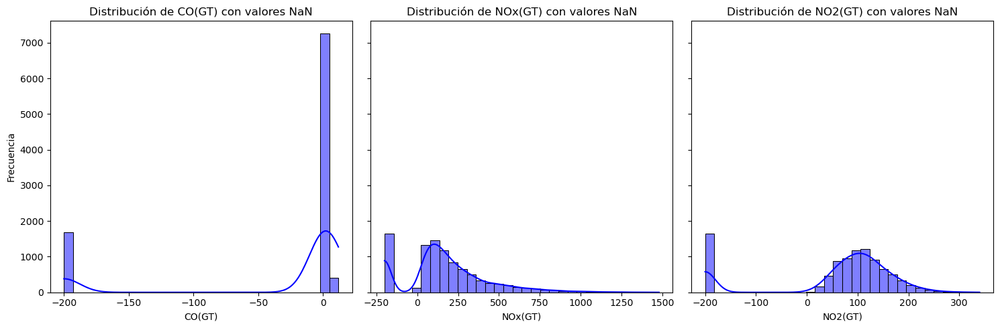

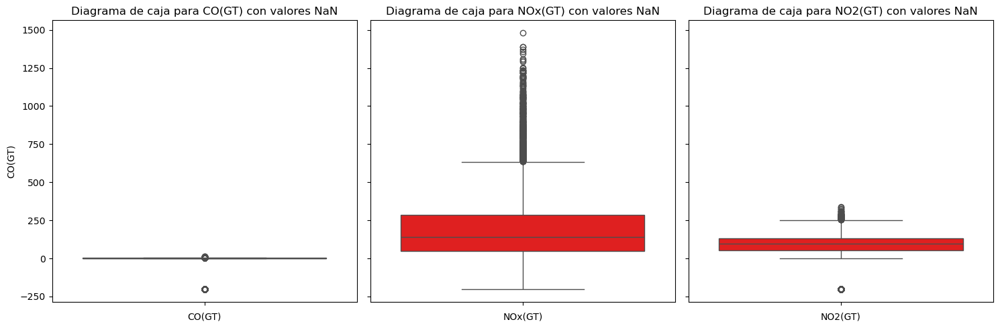

In [79]:
fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.histplot(X[var], kde=True, bins=30, color='blue', ax=axes[i])
    axes[i].set_title(f'Distribución de {var} con valores NaN')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frecuencia')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.boxplot(X[var], color='red', ax=axes[i])
    axes[i].set_title(f'Diagrama de caja para {var} con valores NaN')
    axes[i].set_xlabel(var)
plt.tight_layout()
plt.show()

**CO(GT)**
- **Asimetría a la derecha (sesgo positivo):** La mayoría de los valores de CO están centrados entre 0 y 11.9, lo que sugiere concentraciones generalmente bajas en las mediciones realizadas. Esto se refleja en que el sensor es sensible a pequeñas concentraciones, lo cual es crucial para detectar bajos niveles de este gas. Sin embargo, la presencia de valores atípicos significativos, como -200. Esto afecta la media, que es negativa (-34.2). 
- La cola de la distribución está hacia la derecha, lo que significa que hay más valores pequeños y pocos valores grandes que influyen en los extremos.
- La desviación estándar (77.66) es alta en comparación con otras variables, lo que refleja una considerable variabilidad en los datos. Esto se debe a la presencia de valores atípicos negativos (-200) que distorsionan el cálculo de la media y aumentan la dispersión.

**NOx(GT)**
- **Asimetría a la derecha (sesgo positivo):** Es evidente en el hecho de que la cola hacia la derecha (valores altos) es más larga, con valores atípicos que alcanzan hasta 1479.
- La desviación estándar es significativamente mayor que la de CO(GT), lo que refleja una mayor dispersión en los datos. Esto está relacionado con los valores atípicos extremos.
- Esta variable muestra una mayor dispersión en comparación con CO, como lo evidencia su desviación estándar (257.43). La media positiva (168.62) y los 

**NO2(GT)**
- **Ligera asimetría a la derecha:** Tiene una distribución menos sesgada que CO(GT) y NOx(GT). Aunque sigue siendo ligeramente asimétrica a la derecha, la distribución es más centrada alrededor de valores intermedios, lo que sugiere que las concentraciones de NO2 en el aire son más estables y menos influenciadas por picos extremos en comparación con NOx y CO.
- La dispersión es menor que la de NOx(GT), lo que refleja una mayor concentración de valores alrededor de la mediana y un menor impacto de los valores extremos.

Para comenzar, se transformarán las variables categóricas Time y Date en valores numéricos, para poder tratarlas y analizarlas posteriormente. 

In [80]:
label_encoder = LabelEncoder()

X['Time_encoded'] = label_encoder.fit_transform(X['Time'])
X['Date_encoded'] = label_encoder.fit_transform(X['Date'])

X = X.drop(['Time', 'Date'], axis=1)

Luego, se analizará que hacer con los valores NaN. Para ello se determinó el porcentaje de valores nulos en el dataset, que en este caso es 91.29%, por lo cual su eliminación es inviable. Este método es útil únicamente en casos donde el porcentaje de datos faltantes es bajo y su eliminación no introduce sesgos significativos en el análisis o en las métricas de los modelos predictivos. Sin embargo, en este caso, eliminar un porcentaje tan alto de los datos puede tener un impacto negativo en la calidad de las inferencias y reducir la representatividad del conjunto de datos.

In [81]:
total_values_before = X.size
X_cleaned = val_nan.dropna()
total_values_after = X_cleaned.size
percentage_removed = ((total_values_before - total_values_after) / total_values_before) * 100

print(f"Porcentaje de valores eliminados: {percentage_removed:.2f}%")

Porcentaje de valores eliminados: 91.29%


Antes de proceder con la imputación, se analizó el porcentaje de valores faltantes por variable para determinar si alguna debía ser descartada por contener una cantidad excesiva de valores ausentes. En este caso, NMHC(GT) fue identificada como candidata para ser eliminada debido a su elevado porcentaje de valores faltantes (90.2%), que podría dificultar la imputación precisa o afectar negativamente el análisis.

In [82]:
missing_percentage_per_column = (val_nan.isnull().sum() / len(val_nan)) * 100

print(missing_percentage_per_column)

total_missing_percentage = (val_nan.isnull().sum().sum() / val_nan.size) * 100

print(f"Porcentaje total de valores faltantes: {total_missing_percentage:.2f}%")

Date              0.000000
Time              0.000000
CO(GT)           17.986534
PT08.S1(CO)       3.911510
NMHC(GT)         90.231912
C6H6(GT)          3.911510
PT08.S2(NMHC)     3.911510
NOx(GT)          19.194186
PT08.S3(NOx)      3.911510
NO2(GT)          17.890349
PT08.S4(NO2)      3.911510
PT08.S5(O3)       3.911510
T                 3.911510
RH                3.986320
AH                3.911510
dtype: float64
Porcentaje total de valores faltantes: 12.04%


In [83]:
threshold = 0.6  
cols_to_drop = val_nan.columns[val_nan.isnull().mean() > threshold]
val_nan = val_nan.drop(cols_to_drop, axis=1)
print(cols_to_drop)

Index(['NMHC(GT)'], dtype='object')


Debido a esto, se optó por explorar otros mecanismos de imputación, como la media, la mediana, y métodos basados en datos secuenciales (por ejemplo, el último o el siguiente valor disponible). Aunque estos métodos son generalmente efectivos, se encontró que el método de imputación con KNN produjo los mejores resultados.

In [84]:
numerical_columns = val_nan.select_dtypes(include=['float64', 'int64']).columns

df_numerical = val_nan[numerical_columns]

imputer = KNNImputer(n_neighbors=5, weights="distance")
df_imputed_numerical = pd.DataFrame(imputer.fit_transform(df_numerical), columns=numerical_columns)

df_imputed = val_nan.copy()
df_imputed[numerical_columns] = df_imputed_numerical

In [85]:
df_imputed[variables].describe()

,CO(GT),NOx(GT),NO2(GT)
count,9357.000000,9357.000000,9357.000000
mean,2.095039,229.844901,109.158280
std,1.425251,191.278034,46.834476
min,0.100000,20.000000,20.000000
25%,1.000000,90.000000,73.133253
50%,1.763634,168.000000,104.000000
75%,2.800000,307.000000,136.000000
max,11.900000,1000.000000,340.000000


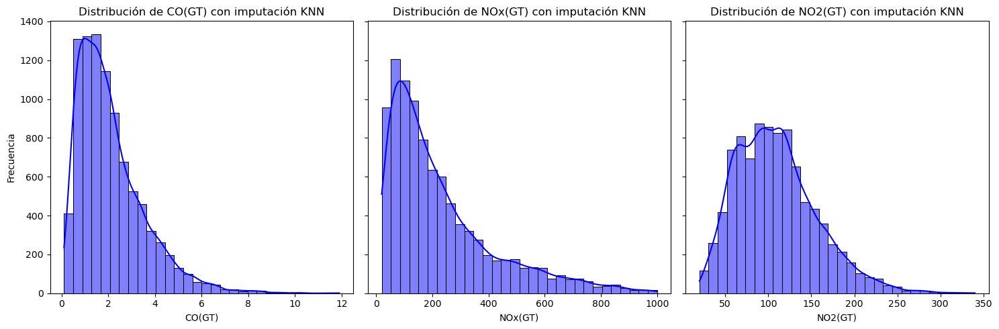

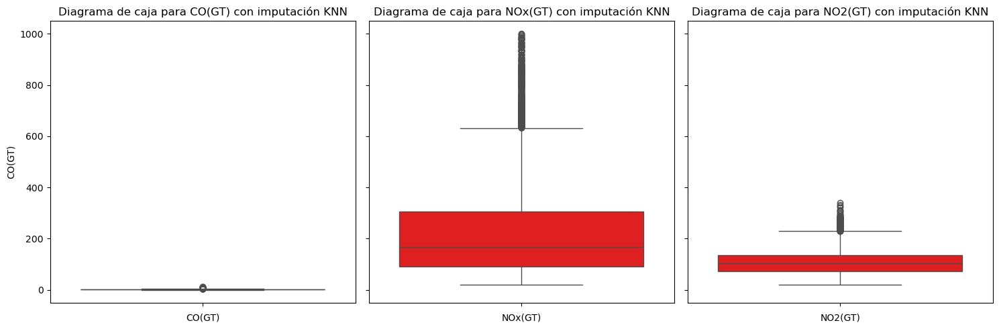

In [86]:
fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.histplot(df_imputed[var], kde=True, bins=30, color='blue', ax=axes[i])
    axes[i].set_title(f'Distribución de {var} con imputación KNN')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frecuencia')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.boxplot(df_imputed[var], color='red', ax=axes[i])
    axes[i].set_title(f'Diagrama de caja para {var} con imputación KNN')
    axes[i].set_xlabel(var)
plt.tight_layout()
plt.show()

Tras aplicar imputación a los valores faltantes en las variables seleccionadas **(CO(GT), NOx(GT) y NO2(GT))**, se observa una mejora significativa en las distribuciones estadísticas, eliminando los valores irreales (-200) y ajustando las métricas.

- **CO(GT):**
    - **Asimetría a la derecha (Sesgo positivo):** La distribución muestra una alta concentración de valores en el rango bajo (0-2), con una cola más larga hacia la derecha. Este tipo de distribución indica que la mayoría de las observaciones se agrupan en el rango inferior, pero algunos valores alcanzan niveles más altos.
    - La desviación estándar de 1.04 refleja que la variabilidad es moderada, pero no excesiva. Esto es consistente con una distribución que, aunque asimétrica, mantiene una mayor concentración de datos en valores bajos
    - Aunque son muy pocos, algunos valores están ligeramente fuera del rango esperado, pero no afectan significativamente la visualización o el análisis de la variable. 
    - La distribución está relativamente compacta, pero tiene un sesgo hacia la derecha. 
- **NOx(GT):**
    - **Asimetría a la derecha (Sesgo positivo):** Al igual que CO(GT), **NOx(GT)** presenta una distribución sesgada hacia la derecha. Sin embargo, en este caso, la dispersión es mayor, como lo indica la desviación estándar de 191.28. Esto sugiere que los valores de NOx son más variables. 
    - La distribución presenta muchos valores atípicos hacia la parte superior del rango. Esto es consistente con la naturaleza altamente variable de las concentraciones de NOx.
    - La cola larga hacia valores altos es evidente en los valores atípicos que superan el percentil 75 (307) y alcanzan hasta un valor máximo de 1000.
    - Esta alta variabilidad y la presencia de valores atípicos son indicativos de concentraciones inusualmente altas.
- **NO2(GT):**
    - **Ligera asimetría a la derecha: NO2(GT)** muestra una distribución más cercana a una distribución simétrica que CO(GT) y NOx(GT). Aunque existe algo de sesgo hacia la derecha, no es tan pronunciado como en las otras dos variables.
    - La mayor parte de los datos están concentrados en un rango intercuartílico más estrecho (entre 50 y 150), lo que sugiere que las concentraciones de NO2 en el aire son, en su mayoría, más consistentes que las de CO y NOx.
    - La desviación estándar de 46.83 es mucho menor que la de NOx(GT), lo que refleja menor variabilidad en los datos.
    - Existen valores atípicos en la parte superior, pero en menor cantidad y menos extremos que en NOx(GT). Ya que los datos están más concentrados. 

La imputación de los valores faltantes ha permitido limpiar las distribuciones de los valores irreales (-200) y ajustar las métricas estadísticas a niveles más representativos. Sin embargo, las distribuciones de **NOx(GT)** y, en menor medida, **NO2(GT)** presentan valores atípicos que podrían requerir un análisis más profundo para tratar estos datos de los extremos. 

Para ello, se hace uso de **IQR** para identificar los valores extremos fuera del rango intercuartílico en cualquiera de las variables numéricas. 

In [87]:
numeric_cols = df_imputed.select_dtypes(include=[np.number])
X_numeric = df_imputed[numeric_cols.columns]

Q1 = X_numeric.quantile(0.25)
Q3 = X_numeric.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

non_outliers_mask = ~((X_numeric < lower_bound) | (X_numeric > upper_bound)).any(axis=1)

df_cleaned = df_imputed[non_outliers_mask]

In [88]:
df_cleaned[variables].describe()

,CO(GT),NOx(GT),NO2(GT)
count,8351.000000,8351.000000,8351.000000
mean,1.867834,196.171545,104.108031
std,1.060295,138.916997,39.861777
min,0.100000,20.000000,20.000000
25%,1.000000,89.000000,73.000000
50%,1.700000,158.000000,101.000000
75%,2.500000,266.000000,129.000000
max,5.500000,632.000000,230.000000


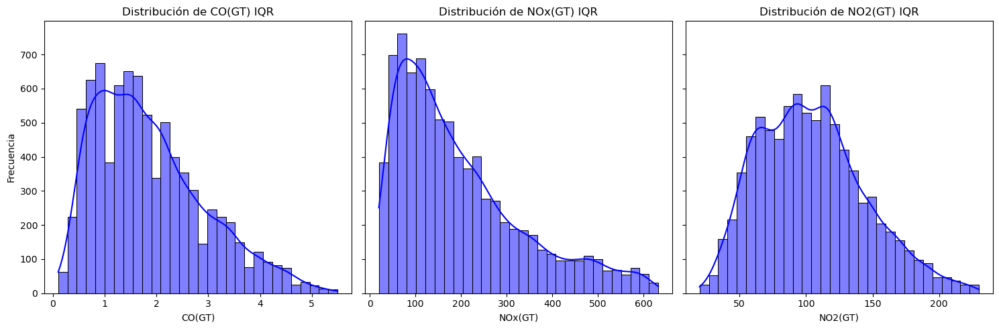

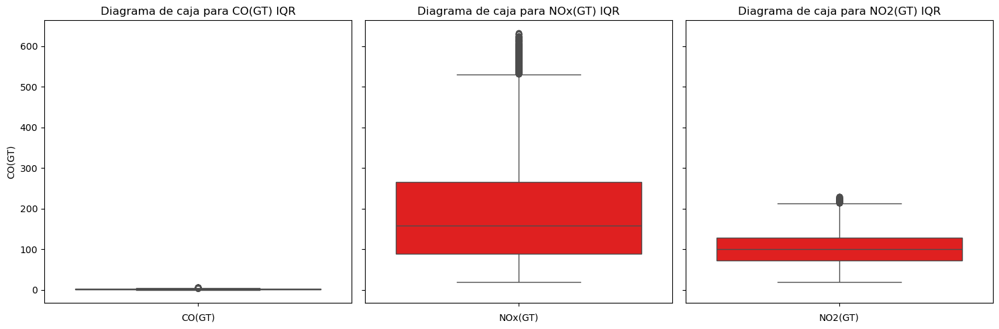

In [89]:
fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.histplot(df_cleaned[var], kde=True, bins=30, color='blue', ax=axes[i])
    axes[i].set_title(f'Distribución de {var} IQR')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frecuencia')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.boxplot(df_cleaned[var], color='red', ax=axes[i])
    axes[i].set_title(f'Diagrama de caja para {var} IQR')
    axes[i].set_xlabel(var)
plt.tight_layout()
plt.show()

- **CO(GT):**
    - **Asimetría a la derecha (sesgo positivo):** Sigue mostrando una asimetría a la derecha, pero en menor medida en comparación con la etapa anterior. 
    - La media y los percentiles indican una distribución más compacta que antes.
    - Desviación estándar más baja en comparación con la etapa anterior, lo que refleja menor dispersión.
    - Los valores más altos son menos frecuentes.
    - El rango entre el mínimo (0.1) y el máximo (5.5) muestra una distribución relativamente compacta, con pocos valores extremos en comparación con otras variables.
- **NOx(GT):**
    - **Asimetría a la derecha (sesgo positivo):** Continúa mostrando una asimetría a la derecha. Sin embargo, la media se ha reducido significativamente en comparación con la etapa anterior, lo que indica que los valores atípicos más elevados han sido controlados de manera más efectiva. 
    - A pesar de la reducción, la cola hacia la derecha sigue siendo notable, lo que significa que existen valores altos .
    - La media se ha reducido significativamente.
    - La desviación estándar (138.91) aunque menor que antes, sigue siendo elevada, lo que indica que la distribución aún tiene cierta variabilidad.
    - Se ha reducido el rango entre el percentil 75 y el máximo. Además, los percentiles 25% y 75% (89 y 266) indican un rango de concentraciones más amplio, lo que refleja la mayor variabilidad y dispersión de los datos.
    - El hecho de que el percentil 75 sea 266 sugiere que la mayoría de los valores están en un rango mucho más bajo, con los valores más altos siendo menos frecuentes.
- **NO2(GT):**
    - **Ligera asimetría a la derecha:**
    - La distribución muestra una forma más simétrica (casi ha desaparecido la cola).
    - La desviación estándar (39.86) es significativamente menor, lo que indica menos dispersión.
    - Aunque la distribución es más controlada, la diferencia entre el percentil 75 y el máximo (129 a 230) muestra la existencia de valores elevados que podrían considerarse outliers.

La eliminación de valores extremos ha reducido el sesgo y la dispersión en los datos, pero las métricas indican que todavía quedan outliers menos severos.

A continuación se ha realizado una transformación logarítmicas y eliminar los valores atípicos que se pueda ocasionar con el método del rango intercuartílico (IQR), como se realizó anteriormente. 

In [90]:
df_cleaned_log = df_cleaned.copy()

for col in numerical_columns:
    if (df_cleaned[col] > 0).all():
        df_cleaned_log[col] = np.log1p(df_cleaned[col])  

numeric_cols = df_cleaned_log.select_dtypes(include=[np.number])
X_numeric = df_cleaned_log[numeric_cols.columns]

Q1 = X_numeric.quantile(0.25)
Q3 = X_numeric.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

non_outliers_mask = ~((X_numeric <= lower_bound) | (X_numeric >= upper_bound)).any(axis=1)

df_cleaned_log = df_cleaned_log[non_outliers_mask]

In [91]:
df_cleaned_log.describe()

,Date,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,8089,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000,8089.000000
mean,2004-09-15 03:07:05.911732096,0.996459,6.973047,2.161242,6.794625,5.044148,6.694328,4.587986,7.255177,6.844450,18.880549,3.845540,0.699682
min,2004-03-10 00:00:00,0.095310,6.546785,0.405465,6.089045,3.091042,6.035481,3.461333,6.669498,5.880533,-1.900000,2.766319,0.187475
25%,2004-06-11 00:00:00,0.734513,6.852243,1.740466,6.616065,4.518872,6.532334,4.317488,7.126087,6.622736,12.600000,3.600048,0.575433
50%,2004-09-09 00:00:00,0.993252,6.964891,2.197225,6.803505,5.087596,6.701960,4.624973,7.285507,6.862758,18.500000,3.916015,0.704087
75%,2004-12-22 00:00:00,1.252763,7.084226,2.610070,6.976348,5.598422,6.859615,4.867534,7.413367,7.091742,24.900000,4.141546,0.843763
max,2005-04-04 00:00:00,1.871802,7.417580,3.374169,7.319865,6.450470,7.263330,5.442418,7.754910,7.615298,42.600000,4.496471,1.144064
std,NaN,0.360469,0.160485,0.585424,0.240106,0.738550,0.238084,0.393104,0.221946,0.334118,8.583922,0.381308,0.193623


#### Diagramas Log

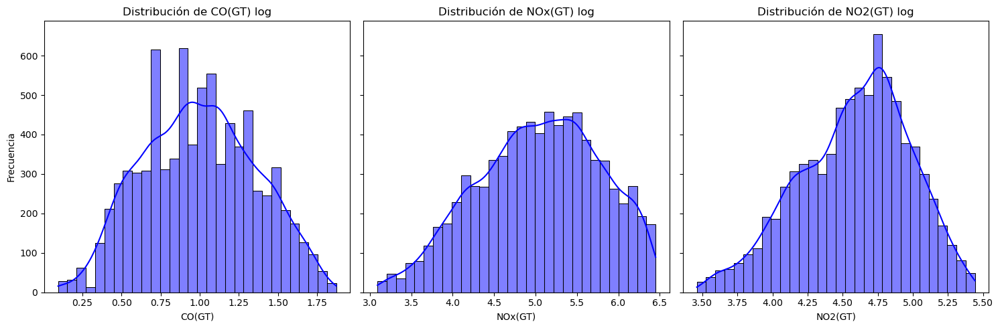

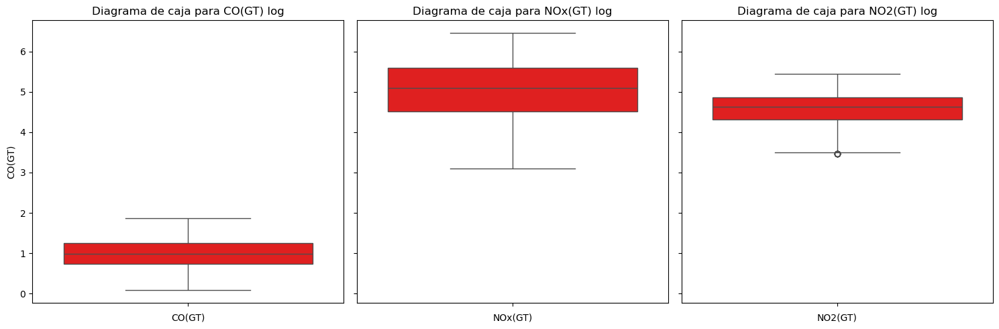

<Figure size 640x480 with 0 Axes>

In [92]:
fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.histplot(df_cleaned_log[var], kde=True, bins=30, color='blue', ax=axes[i])
    axes[i].set_title(f'Distribución de {var} log')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frecuencia')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, len(variables), figsize=(15,5), sharey=True)
for i, var in enumerate(variables):
    sns.boxplot(df_cleaned_log[var], color='red', ax=axes[i])
    axes[i].set_title(f'Diagrama de caja para {var} log')
    axes[i].set_xlabel(var)
plt.tight_layout()
plt.show()
plt.savefig('diagrama_caja_log.png')

- **CO(GT):** 
    - Tiene una distribución bastante simétrica, aunque ligeramente sesgada a la izquierda. Esto sugiere que la transformación logarítmica logró normalizar en gran parte la distribución original.
    - No existen valores extremos en esta representación.
- **NOx(GT):**
    - Presenta una distribución asimétrica sesgada hacia la izquierda. Se observa una mayor densidad en los valores altos, mientras que los valores más bajos tienen menos densidad.
    - No se identifican picos extremos o valores inusuales en esta representación.
- **NO2(GT):**
    - Presenta una distribución más simétrica en comparación con la original, con un ligero sesgo hacia la izquierda.
    - Siguen existiendo valores extremos, en este caso inferiores.

    Al realizar la transformación logarítmica se reduce la amplitud de los valores grandes, comprimiendo los valores extremos altos hacia el centro. Ya que antes la mayor densidad estaba en los valores bajos, se ha producido distribución sesgada a la izquierda. Esto es debido a que expande los valores pequeños y aplana el crecimiento de los valores grandes, reduciendo su influencia. 

In [93]:
df_cleaned = df_cleaned_log.copy()

¿Estas variables muestran alguna distribución especial?¿Tienen datos faltantes?¿y datos anómalos?

#### Comprobar valores nulos

In [94]:
null_values = df_cleaned.isnull().sum().sum()

Los valores nulos actualmente en el dataset son 0.

#### Comprobar outliers 

In [95]:
import pandas as pd
import numpy as np

# Variables numéricas a analizar
numerical_columns = ['CO(GT)', 'NOx(GT)', 'NO2(GT)']

# Cálculo de percentiles y rango intercuartil (IQR)
Q1 = df_cleaned[numerical_columns].quantile(0.25)
Q3 = df_cleaned[numerical_columns].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = {}
for col in numerical_columns:
    outliers[col] = {
        "inferiores": df_cleaned_log[df_cleaned_log[col] < lower_bound[col]].shape[0],
        "superiores": df_cleaned_log[df_cleaned_log[col] > upper_bound[col]].shape[0]
    }

# Mostrar resultados
for col, vals in outliers.items():
    print(f"Variable: {col}")
    print(f" - Valores atípicos inferiores: {vals['inferiores']}")
    print(f" - Valores atípicos superiores: {vals['superiores']}")
    print()


Variable: CO(GT)
 - Valores atípicos inferiores: 0
 - Valores atípicos superiores: 0

Variable: NOx(GT)
 - Valores atípicos inferiores: 0
 - Valores atípicos superiores: 0

Variable: NO2(GT)
 - Valores atípicos inferiores: 8
 - Valores atípicos superiores: 0



**Distribución Especial**

- **CO(GT):**
    - Asimetría sesgada hacia la derecha, lo que indica que los eventos de contaminación con concentraciones bajas de CO son más comunes.
    - Después del tratamiento, la distribución se ha vuelto más compacta, lo que sugiere una reducción exitosa de la dispersión y la eliminación de valores extremos.
- **NOx(GT):**
    - La asimetría hacia la derecha sigue siendo evidente, reflejando la naturaleza altamente variable de esta sustancia en el ambiente.
    - Aunque la cola derecha aún persiste, los valores más extremos han sido mitigados tras el ajuste, lo que mejora la representatividad general de la variable.
- **NO2(GT):**
    - La distribución más cercana a una normal indica que esta variable es más estable y menos afectada por eventos extremos en comparación con las otras dos.

Dichas distribuciones se pueden analizar en [Diagramas Log](#diagramas-log).

**Datos Faltantes**

Originalmente, el dataset tenía variables con valores faltantes representados por -200, que fueron imputados como parte del preprocesamiento. Por lo que, ya no hay datos faltantes en esta etapa, como se comprueba [anteriormente](#comprobar-valores-nulos).

**Datos Anómalos (Outliers)**

- **CO(GT):**
    - **Situación Inicial:**
        - Presentaba valores superiores considerados atípicos, posiblemente debido a picos de contaminación o errores de medición.
    - **Situación Actual:**
        - Después de las transformaciones y el manejo de outliers (logaritmo e IQR), los valores anómalos superiores han sido eliminados.
- **NOx(GT):**
    - **Situación Inicial:**
        - Similar a CO(GT), esta variable presentaba valores anómalos altos. Los máximos extremos se encontraban significativamente alejados del rango intercuartil (IQR), indicando eventos poco frecuentes o mediciones erróneas.
    - **Situación Actual:**
        - Las transformaciones y los filtros aplicados han eliminado los valores extremos superiores.
- **NO2(GT):**
    - **Situación Inicial:**
        - Originalmente, los valores anómalos eran principalmente superiores, representando niveles altos de dióxido de nitrógeno.
    - **Situación Actual:**
        - Sin embargo, persisten algunos valores atípicos en el extremo inferior. Se pueden analizar tanto por [diagrama de cajas](#diagramas-log) como por [código](#comprobar-outliers).

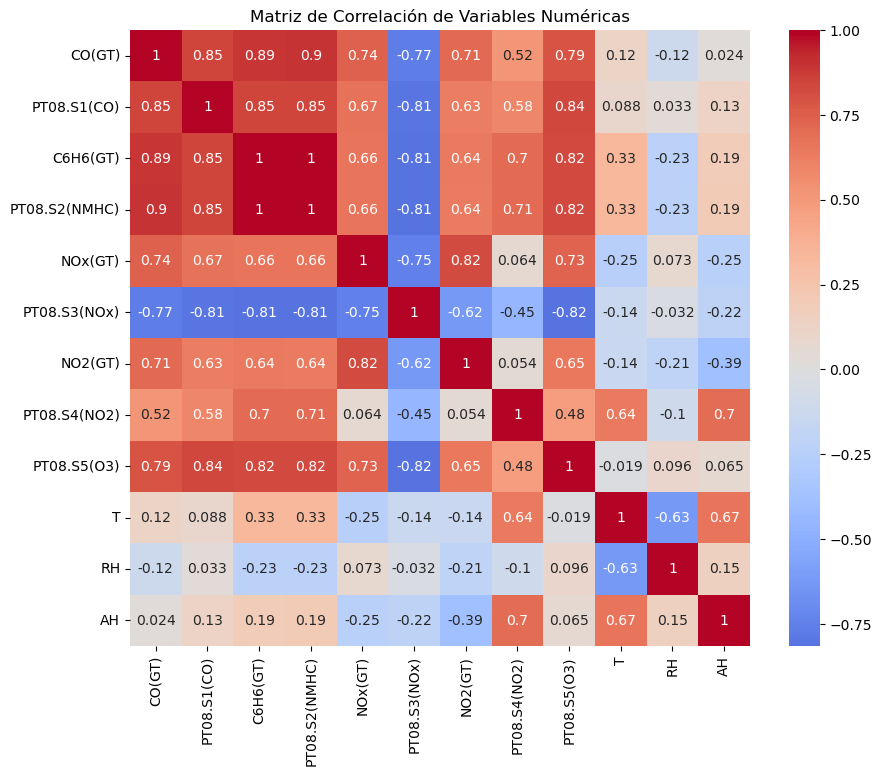

In [96]:
## ¿cómo son las correlaciones entre las variables del dataset?
correlacion = df_cleaned[numeric_cols.columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlación de Variables Numéricas')
plt.show()

In [97]:
correlacion

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.845696,0.892259,0.895329,0.742356,-0.766035,0.712015,0.524162,0.792892,0.115167,-0.122283,0.023544
PT08.S1(CO),0.845696,1.000000,0.846790,0.849826,0.674433,-0.806888,0.630927,0.581827,0.842315,0.087513,0.032588,0.130156
C6H6(GT),0.892259,0.846790,1.000000,0.999392,0.660901,-0.810046,0.638481,0.702738,0.824379,0.327830,-0.231761,0.191575
PT08.S2(NMHC),0.895329,0.849826,0.999392,1.000000,0.661098,-0.811255,0.636188,0.706036,0.824985,0.326752,-0.229559,0.192179
NOx(GT),0.742356,0.674433,0.660901,0.661098,1.000000,-0.748931,0.816563,0.064189,0.733142,-0.252132,0.073465,-0.247527
PT08.S3(NOx),-0.766035,-0.806888,-0.810046,-0.811255,-0.748931,1.000000,-0.624183,-0.448666,-0.815360,-0.136377,-0.031917,-0.215698
NO2(GT),0.712015,0.630927,0.638481,0.636188,0.816563,-0.624183,1.000000,0.054091,0.649145,-0.142702,-0.211223,-0.389611
PT08.S4(NO2),0.524162,0.581827,0.702738,0.706036,0.064189,-0.448666,0.054091,1.000000,0.478263,0.643781,-0.104163,0.700934
PT08.S5(O3),0.792892,0.842315,0.824379,0.824985,0.733142,-0.815360,0.649145,0.478263,1.000000,-0.018860,0.095663,0.064754
T,0.115167,0.087513,0.327830,0.326752,-0.252132,-0.136377,-0.142702,0.643781,-0.018860,1.000000,-0.628452,0.665591


Las correlacoines de las variables del dataset son variadas:

**Correlaciones Fuertes Positivas (Cercanas a 1):**
- **CO(GT) con PT08.S1(CO), C6H6(GT), PT08.S2(NMHC):**
    - CO(GT) tiene correlaciones muy altas con estas variables (entre 0.84 y 0.89). Esto sugiere que estas variables están directamente relacionadas con las concentraciones de monóxido de carbono.
- **C6H6(GT) y PT08.S2(NMHC):**
    - Correlación extremadamente alta (0.999), indicando que estas variables probablemente representan aspectos muy similares de los contaminantes orgánicos volátiles.
- **NOx(GT) con NO2(GT):**
    - Correlación alta (0.823). Esto es esperado, ya que NO2 es un componente principal del NOx y ambos están influenciados por fuentes similares, como emisiones de vehículos y procesos industriales.
- **PT08.S5(O3) con otras variables como CO(GT), C6H6(GT):**
    - Correlaciones fuertes (alrededor de 0.79-0.83) reflejan una relación entre los niveles de ozono y otros contaminantes atmosféricos.

**Correlaciones Fuertes Negativas (Cercanas a -1):**
- **PT08.S3(NOx) con CO(GT), C6H6(GT), PT08.S2(NMHC):**
    - Correlaciones negativas fuertes (alrededor de -0.82). Esto podría deberse a que PT08.S3 mide un aspecto del aire limpio o a una relación inversa entre el parámetro medido y la concentración de contaminantes.
- **PT08.S3(NOx) con NOx(GT):**
    - Correlación negativa (-0.746), lo que sugiere una relación inversa fuerte entre esta variable y el nivel de óxidos de nitrógeno.

**Correlaciones Moderadas:**
- **CO(GT) con NOx(GT) y NO2(GT):**
    - Correlaciones moderadas (0.74 y 0.71). Indican que estas variables están relacionadas, pero la relación no es tan fuerte como con las variables directamente asociadas al CO.
- **Temperatura (T) con AH y RH:**
    - T y AH: Correlación positiva moderada (0.658). Indica que el contenido de agua en el aire (AH) aumenta con la temperatura.
    - T y RH: Correlación negativa moderada (-0.613). Esto es esperado porque la humedad relativa tiende a disminuir cuando la temperatura aumenta, dado el mismo contenido absoluto de agua.
- **PT08.S4(NO2) con AH:**
    - Correlación positiva moderada (0.719), lo que sugiere que este sensor también está influenciado por factores relacionados con la humedad.

**Correlaciones Débiles:**
- **CO(GT) con T y RH:**
    - Correlaciones débiles (0.125 y -0.107). Esto indica que la temperatura y la humedad relativa tienen poca relación directa con los niveles de CO.
- **RH con PT08.S3(NOx) y NOx(GT):**
    - Correlaciones débiles negativas (cercanas a -0.05). Sugiere una relación muy tenue entre estos parámetros y la humedad relativa.

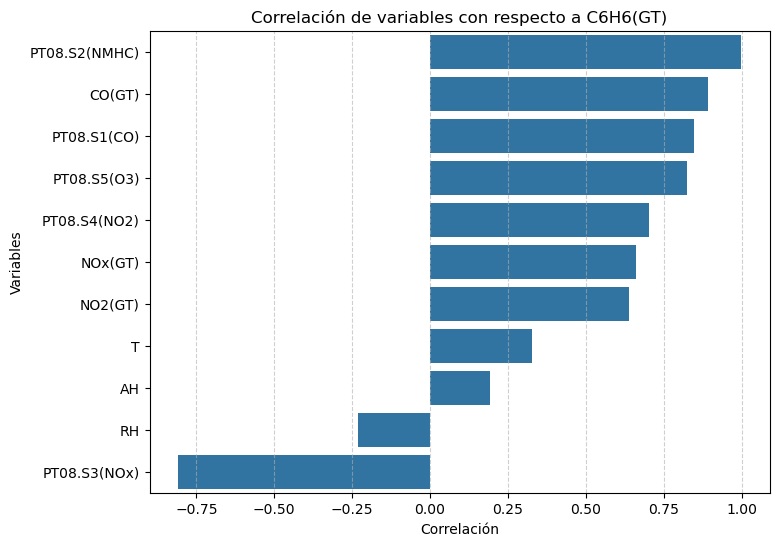

In [98]:
## ¿qué tres variables son las más correlacionadas con la variable objetivo?
variable_interes = "C6H6(GT)" 
correlaciones_variable = correlacion[variable_interes].drop(labels=[variable_interes]).sort_values(ascending=False)
plt.figure(figsize=(8, 6))
sns.barplot(x=correlaciones_variable.values, y=correlaciones_variable.index)
plt.title(f'Correlación de variables con respecto a {variable_interes}')
plt.xlabel('Correlación')
plt.ylabel('Variables')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()

Las tres variables más relacionadas con la variable respuesta (C6H6(GT)) son:
- **PT08.S2(NMHC)** (Correlación: 0.999392	):
    - Esta variable tiene una correlación casi perfecta con C6H6(GT), lo que indica una fuerte relación lineal positiva. Probablemente mide un fenómeno químico o ambiental estrechamente relacionado con la concentración de benceno.
- **CO(GT)** (Correlación: 0.892259):
    - Existe una alta correlación positiva con C6H6(GT), lo que sugiere que la presencia de monóxido de carbono está estrechamente relacionada con la del benceno en el aire.
- **PT08.S1(CO)** (Correlación: 0.846790):
    - Este sensor, diseñado para medir monóxido de carbono, también está altamente correlacionado con las concentraciones de benceno, posiblemente debido a fuentes comunes de emisión.

In [99]:
## ¿existe alguna variable que no tenga correlación?
umral = 0.1

triangular_superior = np.triu(np.ones(correlacion.shape), k=1).astype(bool)
correlacion_low_sin_repetir = correlacion.where(triangular_superior).stack()
correlacion_low_sin_repetir = correlacion_low_sin_repetir[(correlacion_low_sin_repetir.abs() < umral)]
correlacion_low_sin_repetir

CO(GT)        AH              0.023544
PT08.S1(CO)   T               0.087513
              RH              0.032588
NOx(GT)       PT08.S4(NO2)    0.064189
              RH              0.073465
PT08.S3(NOx)  RH             -0.031917
NO2(GT)       PT08.S4(NO2)    0.054091
PT08.S5(O3)   T              -0.018860
              RH              0.095663
              AH              0.064754
dtype: float64

| Variable 1        | Variable 2        | Valor      |
|--------------------|-------------------|------------|
| CO(GT)            | AH                | 0.023544   |
| PT08.S1(CO)       | T                 | 0.087513   |
|                   | RH                | 0.032588   |
| NOx(GT)           | PT08.S4(NO2)      | 0.064189   |
|                   | RH                | 0.073465   |
| PT08.S3(NOx)      | RH                | -0.031917  |
| NO2(GT)           | PT08.S4(NO2)      | 0.054091   |
| PT08.S5(O3)       | T                 | -0.018860  |
|                   | RH                | 0.095663   |
|                   | AH                | 0.064754   |

- **CO(GT) y AH (Humedad Absoluta):**
    - Correlación: 0.023544
    - La relación es extremadamente débil, lo que sugiere que los niveles de monóxido de carbono no están relacionados con los cambios en la humedad absoluta del aire.

- **PT08.S1(CO) y T:**
    - Correlación: 0.087513
    - La baja correlación indica que puede haber una ligera tendencia a que aumente la señal del sensor con el aumento de la temperatura, pero el efecto es casi insignificante.

- **PT08.S1(CO) y RH (Humedad Relativa):**
    - Correlación: 0.032588
    - La baja correlación indica que las lecturas del sensor PT08.S1 (asociado a CO) no tienen una dependencia lineal clara con la humedad relativa.

- **NOx(GT) y PT08.S4(NO2):**
    - Correlación: 0.064189
    - La relación entre óxidos de nitrógeno y las lecturas del sensor PT08.S4 (relacionado con NO2) es casi inexistente.

- **NOx(GT) y RH (Humedad Relativa):**
    - Correlación: 0.073465
    - Muestra una conexión muy débil entre los niveles de óxidos de nitrógeno y la humedad relativa.

- **PT08.S3(NOx) y RH (Humedad Relativa):**
    - Correlación: -0.031917
    - Relación inversa muy leve, prácticamente irrelevante, entre este sensor y la humedad relativa.

- **NO2(GT) y PT08.S4(NO2):**
    - Correlación: 0.054091
    - Baja relación entre las mediciones de NO2 y el sensor PT08.S4, lo que sugiere que podrían estar midiendo aspectos diferentes o que el vínculo no es significativo.

- **PT08.S5(O3) y T (Temperatura):**
    - Correlación: 0.018860
    - Prácticamente ninguna relación entre el sensor PT08.S5 (relacionado con O3) y la temperatura.

- **PT08.S5(O3) y RH:**
    - Correlación: 0.095663
    - El aumento en la humedad puede estar asociado con ligeros aumentos en la señal del sensor.

- **PT08.S5(O3) y AH:**
    - Correlación: 0.064754
    - La humedad absoluta podría influir ligeramente en la señal del sensor, pero la relación sigue siendo tenue.

En base al EDA realizado, ¿qué suposiciones se pueden hacer sobre los datos?¿qué conclusiones extraes para implementar el modelo predictivo?

En el proceso de **Exploratory Data Analysis (EDA)**, el objetivo principal es entender el comportamiento de los datos, las relaciones entre las variables, las distribuciones, y las características generales del conjunto de datos. A partir de este análisis, se pueden hacer varias suposiciones sobre los datos y extraer conclusiones útiles para la implementación de un modelo predictivo.

**Suposiciones.**

- **Distribución y Outliers:**
    - Aunque los valores atípicos han sido mitigados, algunas variables como NOx(GT) aún presentan outliers menores, que pueden influir negativamente en el modelo. 
- **Correlaciones entre Variables:**
    - El análisis de correlaciones permite identificar que variables tienen relaciones lineales fuertes entre sí. Si algunas variables están altamente correlacionadas, esto podría indicar que hay redundancia en los datos, y tal vez sea necesario eliminar una de las variables para evitar problemas de multicolinealidad. 
    - Las variables con baja correlación con la respuesta, podrían ser descartadas.
- **Variables Categóricas:**
    - La alta cardinalidad en estas variables puede introducir ruido si no se manejan adecuadamente.
- **Valores Faltantes:**
    - Algunas variables tenían una proporción significativa de datos faltantes que se imputaron utilizando técnicas avanzadas como KNN. Esto puede introducir sesgos o incertidumbre en el modelo, aunque los análisis muestran que la imputación mejoró las distribuciones.
- **Relaciones No Lineales**:
    - La existencia de relaciones no lineales sugiere que un modelo lineal podría no ser ideal. Modelos como árboles de decisión o Random Forest son más robustos frente a este tipo de patrones.

**Conclusiones.**

- **Relaciones lineales:**
    - C6H6(GT) muestra una fuerte correlación positiva con variables como PT08.S2(NMHC), CO(GT), y PT08.S1(CO). Estas relaciones sugieren que estas variables tienen potencial como predictores principales para el modelo.
- **Selección de Variables:**
    - Se debe considerar la eliminación de variables altamente correlacionadas para reducir la multicolinealidad. Esto ayudará a simplificar el modelo y evitar sobreajuste.
    - Las variables categóricas codificadas (como Time_encoded y Date_encoded) deben ser analizadas para asegurarse de que su codificación tenga sentido en el contexto del modelo.
    - Realizar normalización o estandarización  antes del entrenamiento del modelo.
- **Evaluación del Modelo:**
    - Evaluar el modelo utilizando diferentes métricas, para asegurarse de que el modelo está capturando adecuadamente la variabilidad de los datos. 
    - Validar el modelo con un conjunto de datos de prueba o mediante validación cruzada para evitar el overfitting. 
- **Manejo de Multicolinealidad:**
    - La multicolinealidad debe ser evaluada y, si es significativa, mitigada.

### Regresión

Para llevar a cabo la tarea de regresión deseada se pretender hacer una comparativa de varios modelos. Unos usarán el algortimo de regresión lineal, y otros realizarán la predicción haciendo uso de árboles de decisión.

Para los primeros modelos hay que usar el módulo https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html 

El algortimo de Regresión Lineal necesita saber cuáles son las variables que va a tener en cuenta para realizar la estimación.

El primero modelo que se debe construir usará una regresión lineal simple. Para ello sigue los siguientes pasos.

Antes de empezar con la implementación de los modelos hace falta realizar una transformación de datos, escalarlos.

In [100]:
from sklearn.discriminant_analysis import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from pandas import DataFrame
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import root_mean_squared_error
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error, make_scorer

scaler = MinMaxScaler()

Para comenzar, se identificó que la variable PT08.S2(NMHC) presentaba la relación más cercana a la linealidad con la variable respuesta.

In [101]:
df_cleaned = df_cleaned.drop(['Date', 'Time'], axis=1)


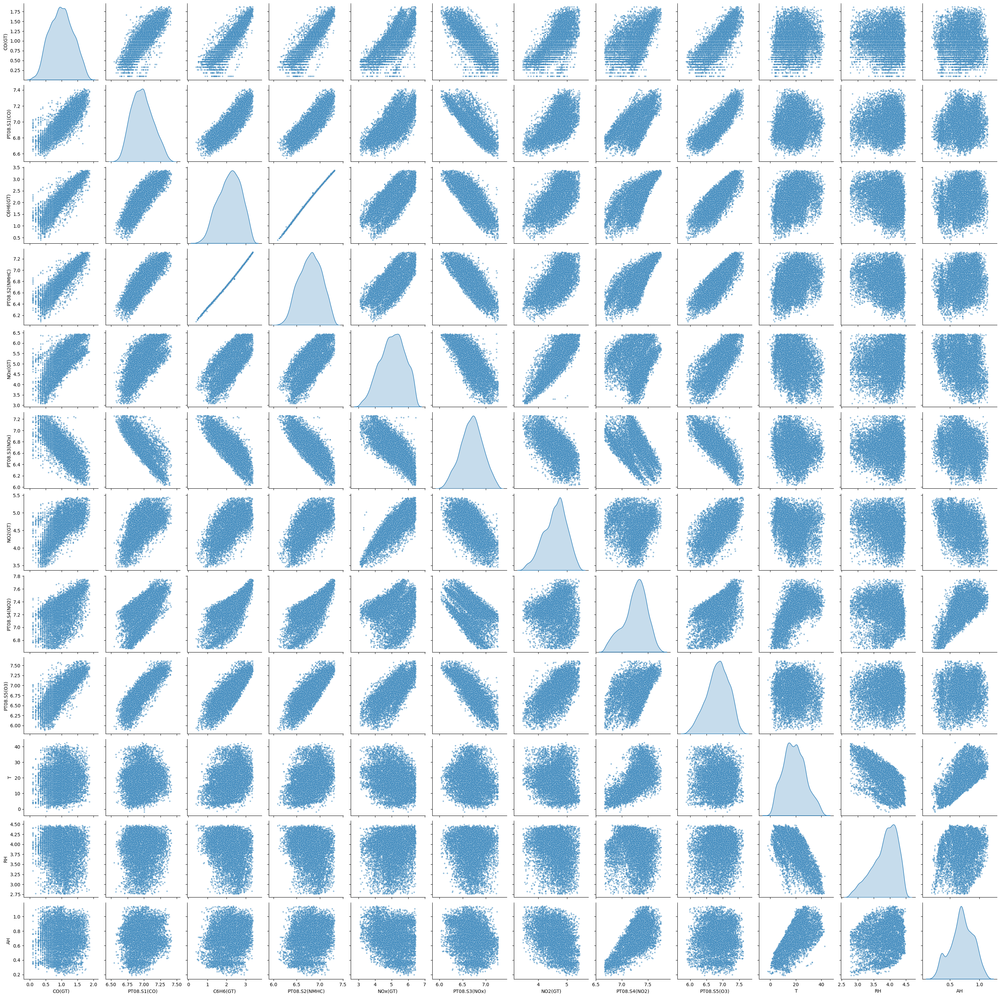

In [102]:
# escoger la variable que a partir del EDA realizado, consideres que mejor va a realizar la predicción
sns.pairplot(data=df_cleaned[numeric_cols.columns], diag_kind='kde', plot_kws={'alpha': 0.5, 's': 10})
plt.show()

X = df_cleaned[['PT08.S2(NMHC)']]
y = df_cleaned['C6H6(GT)']

La siguiente gráfica permite ver la relación entre ambas variables de forma más clara.

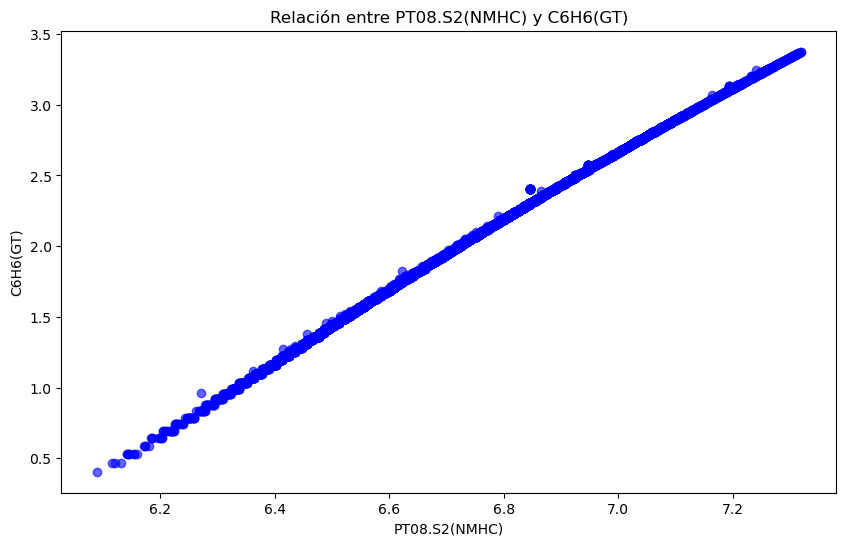

In [103]:
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', alpha=0.6) 
plt.title('Relación entre PT08.S2(NMHC) y C6H6(GT)')
plt.xlabel('PT08.S2(NMHC)')
plt.ylabel('C6H6(GT)')
plt.show()

Hay que comprobar que es lineal ambas, que si lo son. Comprobar con un plot que la variable elegida se relaciona de manera lineal con la variable objetivo.

También distribución normal de los residuos. Comprobar con un plot que la diferencia entre los valores de test de la variable y los valores de predicción siguen(se asemejan) a una distribución normal. 

Homocedasticidad. Hacer un plot de residuos vs predicción. Sigue el fune, que es eso? xd

Autocorrelación. Durbin Watson test

In [104]:
# separar datos de entrenamiento y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

X_train_numeric = scaler.fit_transform(X_train)
X_test_numeric = scaler.transform(X_test)

X_train_scaled = DataFrame(X_train_numeric)
X_test_scaled = DataFrame(X_test_numeric)

Se comprueba que los valores fueron cargados correctamente analizando los head() de las variables.

In [105]:
X_train.head()

,PT08.S2(NMHC)
7700,6.583409
744,6.833032
2944,6.609349
9193,6.969791
506,6.860664


In [106]:
y_train.head()

7700    1.648659
744     2.272126
2944    1.722767
9193    2.595255
506     2.332144
Name: C6H6(GT), dtype: float64

In [107]:
# entrena el modelo con los datos de entrenamiento
model = LinearRegression()
model.fit(X_train_scaled, y_train)

LinearRegression()

In [108]:
# ¿cuáles son los valores aprendidos por el modelo para los parámetros?
coeficientes = model.coef_
intercepto = model.intercept_

In [109]:
coeficientes

array([2.92459479])

In [110]:
intercepto

0.5072726225295152

Explica qué indican estos parámetros

**Coeficientes**: representan la pendiente de cada variable independiente PT08.S2(NMHC). Los coeficientes positivos tienen una relación positiva. Un coeficiente negativo indica una relación inversa. La variable dependiente C6H6(GT) aumenta en aproximadamente 2.92 unidades. La pendiente positiva confirma que existe una relación positiva entre las dos variables.

**Intercepto**: Este valor indica el punto donde la línea de regresión cruza el eje y. Es decir, el valor esperado de C6H6(GT) cuando PT08.S2(NMHC) es igual a 0.

In [111]:
# realiza las predicciones para el conjunto de datos de test
y_pred = model.predict(X_test_scaled)

In [112]:
# Ahora es necesario evaluar el modelo. ¿Qué métrica es mejor utilizar en este caso?
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmsle = root_mean_squared_error(y_test, y_pred)

- R²: Para determinar qué tan bien se ajusta la relación entre PT08.S2(NMHC) y C6H6(GT), ya que se evalua la linealidad.
- MAE o RMSE: Para evaluar el error promedio en unidades de C6H6(GT).
- MSE: Si se desea priorizar la penalización de errores grandes en lugar de pequeños.

In [113]:
# ¿Qué error tiene el modelo? Explícalo.
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'R²: {r2}')
print(f'MAE: {mae}')
print(f'RMSLE: {rmsle}')

y_train_pred = model.predict(X_train_scaled)

mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = mse_train**0.5
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

print(f'Entrenamiento - MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}, MAE: {mae_train}')
print(f'Prueba - MSE: {mse}, RMSE: {rmse}, R²: {r2}, MAE: {mae}')

kfold = KFold(n_splits=5, shuffle=True, random_state=42)  

mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

scores = cross_val_score(model, X, y, cv=kfold, scoring='r2')

print("r2 en cada fold:", scores)  
print("r2 promedio:", scores.mean())

MSE: 0.00040008244728582715
RMSE: 0.02000206107594483
R²: 0.9988638282860455
MAE: 0.015098565427762074
RMSLE: 0.02000206107594483
Entrenamiento - MSE: 0.0004218460710063495, RMSE: 0.020538891669375673, R²: 0.9987575084490536, MAE: 0.015440680094508488
Prueba - MSE: 0.00040008244728582715, RMSE: 0.02000206107594483, R²: 0.9988638282860455, MAE: 0.015098565427762074
r2 en cada fold: [0.99889407 0.99871337 0.99877453 0.99874147 0.99877853]
r2 promedio: 0.9987803974160506


El modelo presenta valores bajos en ajos en las métricas de error (MSE, RMSE, MAE) y un coeficiente de determinación (R²) muy cercano a 1. Esto implica que:
- PT08.S2(NMHC) es un predictor eficaz.
- Los valores de validación cruzada son robustos y estables.

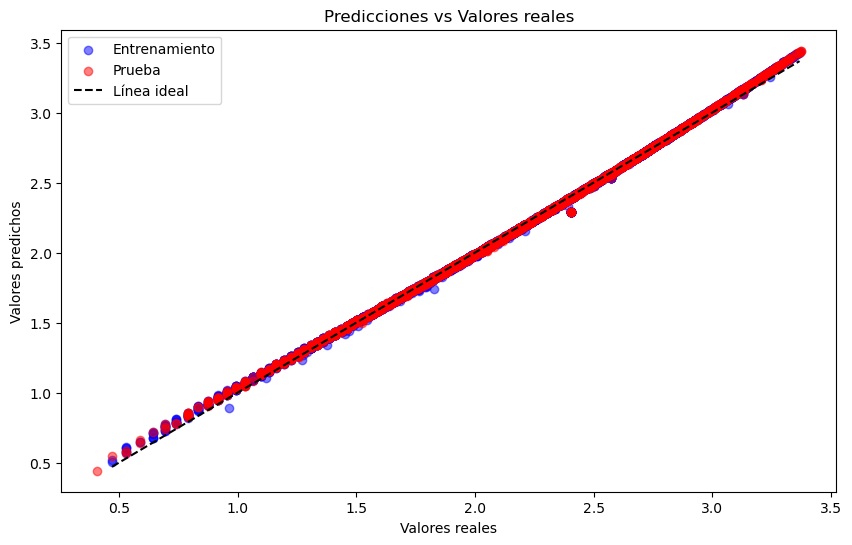

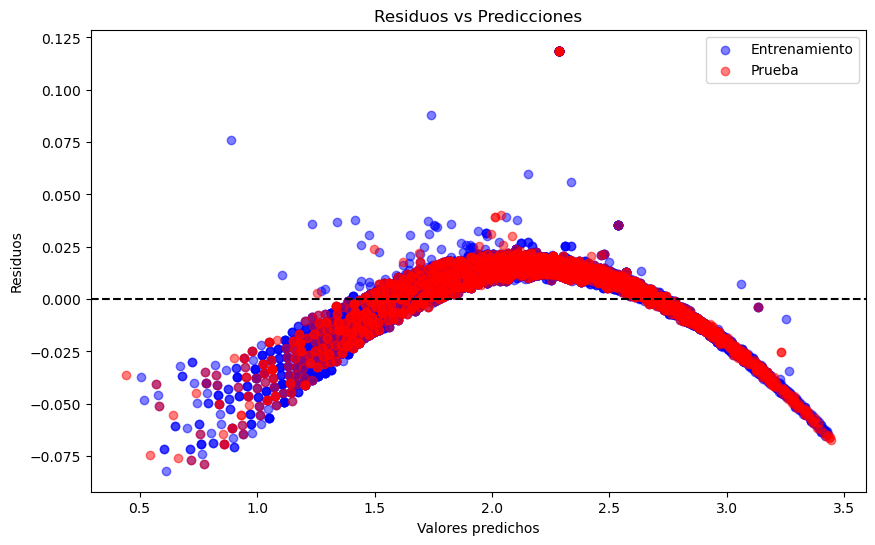

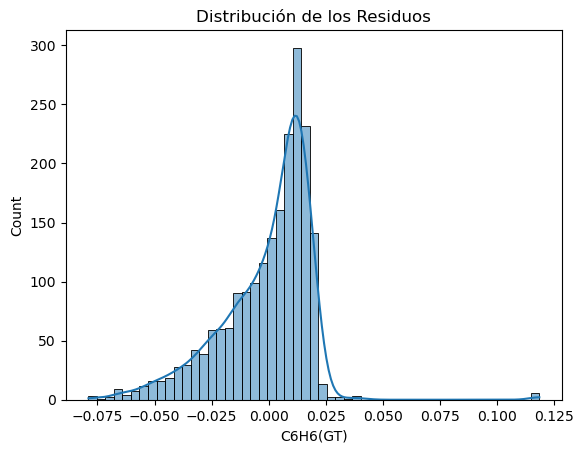

In [114]:
import scipy.stats as stats

plt.figure(figsize=(10, 6))

plt.scatter(y_train, y_train_pred, color='blue', label='Entrenamiento', alpha=0.5)

plt.scatter(y_test, y_pred, color='red', label='Prueba', alpha=0.5)

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='black', linestyle='--', label='Línea ideal')

plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.title('Predicciones vs Valores reales')


plt.legend()

plt.show()

residuos_train = y_train - y_train_pred
residuos_test = y_test - y_pred

plt.figure(figsize=(10, 6))

plt.scatter(y_train_pred, residuos_train, color='blue', label='Entrenamiento', alpha=0.5)

plt.scatter(y_pred, residuos_test, color='red', label='Prueba', alpha=0.5)

plt.axhline(0, color='black', linestyle='--')

plt.xlabel('Valores predichos')
plt.ylabel('Residuos')
plt.title('Residuos vs Predicciones')

plt.legend()

plt.show()

residuals = y_test - y_pred  

sns.histplot(residuals, kde=True)
plt.title("Distribución de los Residuos")
plt.show()

Aunque el modelo de regresión lineal tiene un buen desempeño y las métricas de error son bajas, la distribución no normal de los residuos sugiere que la relación entre las variables no es completamente lineal. 

Sin embargo, el valor cercao a 2 de Durbin-Watson, indica que no hay problemas significativos de autocorrelación en los residuos de tu modelo.

In [115]:
import statsmodels.api as sm
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuos_test)

print(f"Estadístico de Durbin-Watson: {dw_statistic}")

Estadístico de Durbin-Watson: 2.0449172757336567


Además, se hizo uso de técnicas como **StratifiedShuffleSplit** y **KFold** pero dieron peores resultados, por lo que se descartaron a lo largo del estudio.

Ahora debes entrenar un segundo modelo que haga uso de una regresión lineal múltiple con todas las variables del dataset. Después de entrenar, realiza las predicciones para este segundo modelo.

En vez de usar todas las variables del dataset, se han eliminado variables del conjunto de datos para simplificar el modelo, reduciendo la multicolinealidad, teniendo en cuenta la correlación de las variables entre ellas y con la variable respuesta.

In [116]:
X = df_cleaned.drop(columns=['C6H6(GT)', 'PT08.S1(CO)', 'PT08.S5(O3)', 'PT08.S4(NO2)']) 

X_numeric = X.select_dtypes(include=['float64', 'int64'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

X_train_numeric = scaler.fit_transform(X_train)
X_test_numeric = scaler.transform(X_test)

X_train_scaled = DataFrame(X_train_numeric)
X_test_scaled = DataFrame(X_test_numeric)

modelo = LinearRegression()
model.fit(X_train_scaled, y_train)

LinearRegression()

In [117]:
y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmsle = root_mean_squared_error(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'R²: {r2}')
print(f'MAE: {mae}')
print(f'RMSLE: {rmsle}')

y_train_pred = model.predict(X_train_scaled)

mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = mse_train**0.5
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

print(f'Entrenamiento - MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}, MAE: {mae_train}')
print(f'Prueba - MSE: {mse}, RMSE: {rmse}, R²: {r2}, MAE: {mae}')

kfold = KFold(n_splits=5, shuffle=True, random_state=42)  # 5 particiones

mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

X_numeric = X.select_dtypes(include=['float64', 'int64'])

scores = cross_val_score(model, X_numeric, y, cv=kfold, scoring='r2')

print("r2 en cada fold:", scores) 
print("r2 promedio:", scores.mean())


MSE: 0.0003725052405216686
RMSE: 0.019300394828128998
R²: 0.9989421432495933
MAE: 0.014512849215031582
RMSLE: 0.019300394828128998
Entrenamiento - MSE: 0.00039260097400829486, RMSE: 0.019814160946360935, R²: 0.9988436459964296, MAE: 0.014884265772533892
Prueba - MSE: 0.0003725052405216686, RMSE: 0.019300394828128998, R²: 0.9989421432495933, MAE: 0.014512849215031582
r2 en cada fold: [0.9989703  0.99878199 0.9988604  0.99884889 0.99885241]
r2 promedio: 0.998862798575973


El modelo está mostrando un rendimiento excelente tanto en los datos de entrenamiento como en los de prueba, con un R² muy cercano a 1 y un MSE extremadamente bajo. Esto indica que el modelo ha aprendido muy bien la relación entre las características y la variable objetivo y está haciendo predicciones precisas.

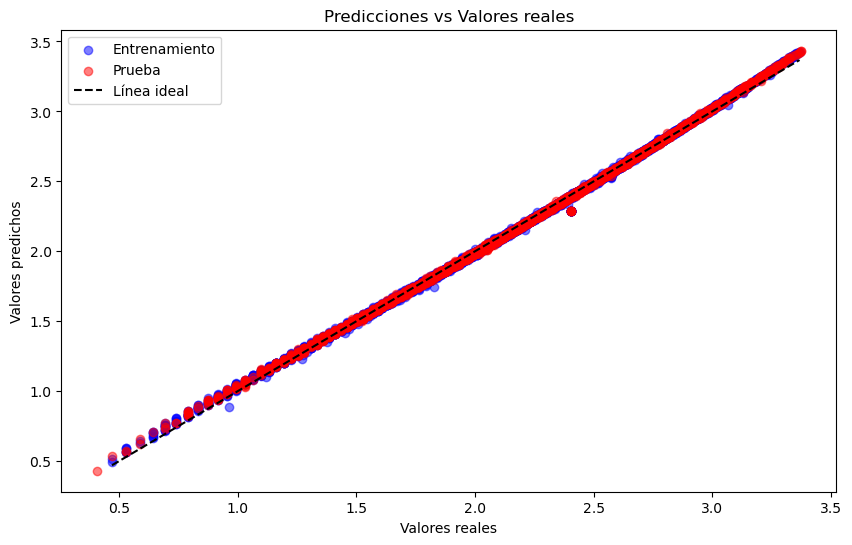

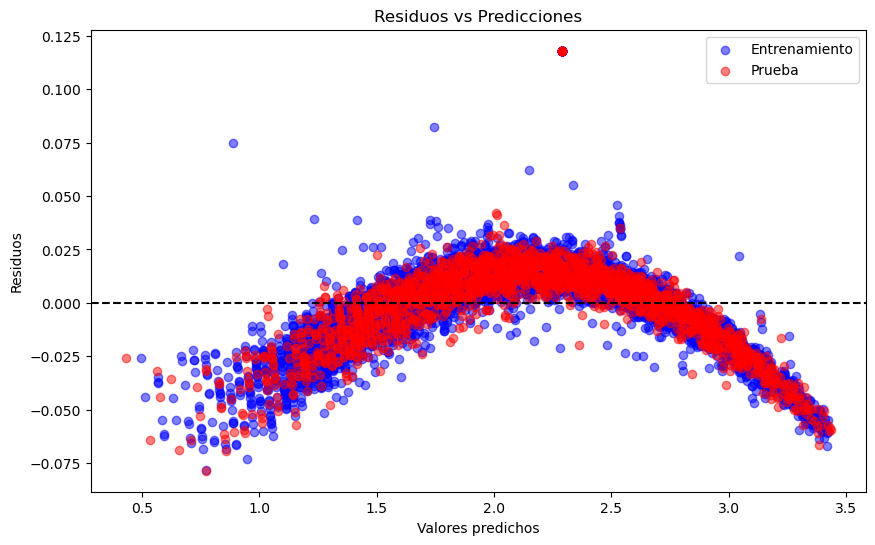

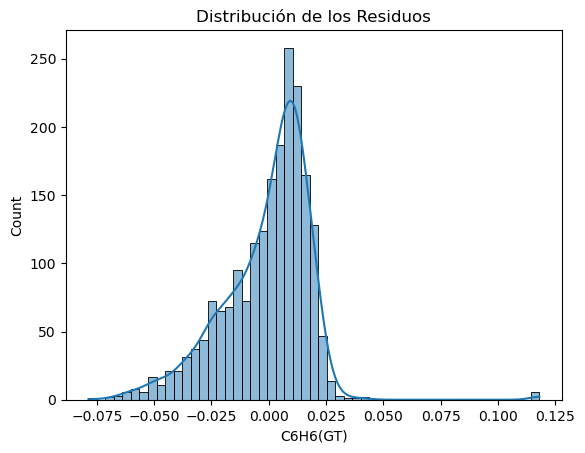

In [118]:
plt.figure(figsize=(10, 6))

plt.scatter(y_train, y_train_pred, color='blue', label='Entrenamiento', alpha=0.5)

plt.scatter(y_test, y_pred, color='red', label='Prueba', alpha=0.5)

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='black', linestyle='--', label='Línea ideal')

plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.title('Predicciones vs Valores reales')

plt.legend()

plt.show()

residuos_train = y_train - y_train_pred
residuos_test = y_test - y_pred

plt.figure(figsize=(10, 6))

plt.scatter(y_train_pred, residuos_train, color='blue', label='Entrenamiento', alpha=0.5)

plt.scatter(y_pred, residuos_test, color='red', label='Prueba', alpha=0.5)

plt.axhline(0, color='black', linestyle='--')

plt.xlabel('Valores predichos')
plt.ylabel('Residuos')
plt.title('Residuos vs Predicciones')

plt.legend()

plt.show()

residuals = y_test - y_pred  

sns.histplot(residuals, kde=True)
plt.title("Distribución de los Residuos")
plt.show()

In [119]:
dw_statistic = durbin_watson(residuos_test)

print(f"Estadístico de Durbin-Watson: {dw_statistic}")

Estadístico de Durbin-Watson: 2.026981778528322


El estadístico de Durbin-Watson que has obtenido es 2.026981778528322, lo cual es un valor muy importante para evaluar la presencia de autocorrelación en los residuos del modelo de regresión. A pesar de no tener una distribución normal en los residuos.

¿Qué error tiene este modelo?¿Es mejor o peor que el anterior?

La regresión lineal múltiple tiene un desempeño ligeramente superior en términos de precisión, explicabilidad (R²) y consistencia (cross-validation). La diferencia entre los dos casos es pequeña, pero es suficiente para considerar que este podría ser el modelo más robusto. Aunque ambos modelos tienen un rendimiento alto y adecuado para la predicción.

#### Regresión con árboles de decisión

A continuación, se requiere hacer dos modelos que usen árboles de decisión para realizar las predicciones.

Para los árboles de decisión, al ser una tarea de regresión, hay que usar el módulo https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html

El algortimo de DTRegressor necesitar ajustar una serie de hiperparámetros para realizar las predicciones. La implementación de sklearn nos da mucha flexibilidad para nuestros modelos. En general, para los problemas más comunes de regresión, nos tenemos que preocupar de los siguientes hiperparámetros:

* criterion
* splitter
* max_depth
* min_samples_split
* min_samples_leaf
* max_features

Indica qué son cada uno de estos hiperparámetros

* criterion: Mide la calidad de una división. 
* splitter:a estrategia utilizada para elegir la división en cada nodo.
* max_depth: La profundidad máxima del árbol.
* min_samples_split: El número mínimo de muestras necesarias para dividir un nodo interno
* min_samples_leaf: La cantidad mínima de muestras que se requiere que haya en un nodo de hoja. 
* max_features: La cantidad de características a tener en cuenta al buscar el mejor split.

Además de los hiperparámetros que acabas de descubrir, la implementación de sklearn tiene el hiperparámetro min_impurity_decrease

¿Qué indica ese parámetro? ¿Para qué puede ser útil?

Un nodo se dividirá si esta división induce una disminución de la impureza mayor o igual a este valor. Util para controlar la profundidad del árbol, simplificación del modelo, evitar divisiones insignificantes. 

In [120]:
from sklearn import tree
from sklearn.metrics import root_mean_squared_error

Entrena un modelo de árboles de decisión donde, el criterio para realizar las particiones sea _poisson_, la profundidad máxima de los árboles debe ser 10, el número mínimo de ejemplos para realizar una partición debe ser 10, el número mínimo de ejemplos para considerarlo una hoja debe ser 2, y el número máximo de características deben ser todas.

In [121]:
X = df_cleaned.drop(columns=['C6H6(GT)', 'PT08.S1(CO)', 'PT08.S5(O3)', 'PT08.S4(NO2)']) 
y = df_cleaned['C6H6(GT)']

X_numeric = X.select_dtypes(include=['float64', 'int64'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

X_train_numeric = scaler.fit_transform(X_train)
X_test_numeric = scaler.transform(X_test)

X_train_scaled = DataFrame(X_train_numeric)
X_test_scaled = DataFrame(X_test_numeric)

clf = tree.DecisionTreeRegressor(
    criterion='poisson',
    max_depth=10,
    min_samples_split=10,
    min_samples_leaf=2,
    max_features=None,  
    random_state=42,
)

clf.fit(X_train_scaled, y_train)

y_pred_dt = clf.predict(X_test_scaled)

Calcula MAE, R2 y RMSLE

In [122]:
mse_dt = mean_squared_error(y_test, y_pred_dt)
rmse_dt = mse_dt**0.5
mae_dt = mean_absolute_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
rmsle_dt = root_mean_squared_error(y_test, y_pred_dt)

print(f'MSE: {mse_dt}')
print(f'RMSE: {rmse_dt}')
print(f'R²: {r2_dt}')
print(f'MAE: {mae_dt}')
print(f'RMSLE: {rmsle_dt}')


MSE: 2.9017549802119363e-05
RMSE: 0.005386794018905806
R²: 0.9999175946870024
MAE: 0.001680435777348735
RMSLE: 0.005386794018905806


Las métricas continúan mostrando un modelo con un gran desempeño:
- MSE y RMSE muy bajos, indicando que las predicciones están muy cerca de los valores reales.
- R² cercano a 1, lo que indica que el modelo explica casi toda la variabilidad de los datos.
- MAE extremadamente bajo, lo que refuerza la precisión del modelo.

¿Existe overfitting? Indica qué debes hacer para comprobar si hay overfitting.

In [123]:
y_train_pred = clf.predict(X_train_scaled)

mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = mse_train**0.5
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

print(f'Entrenamiento - MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}, MAE: {mae_train}')
print(f'Prueba - MSE: {mse_dt}, RMSE: {rmse_dt}, R²: {r2_dt}, MAE: {mae_dt}')

Entrenamiento - MSE: 9.653556353516114e-06, RMSE: 0.003107017276024727, R²: 0.9999715667324406, MAE: 0.000913480628563607
Prueba - MSE: 2.9017549802119363e-05, RMSE: 0.005386794018905806, R²: 0.9999175946870024, MAE: 0.001680435777348735


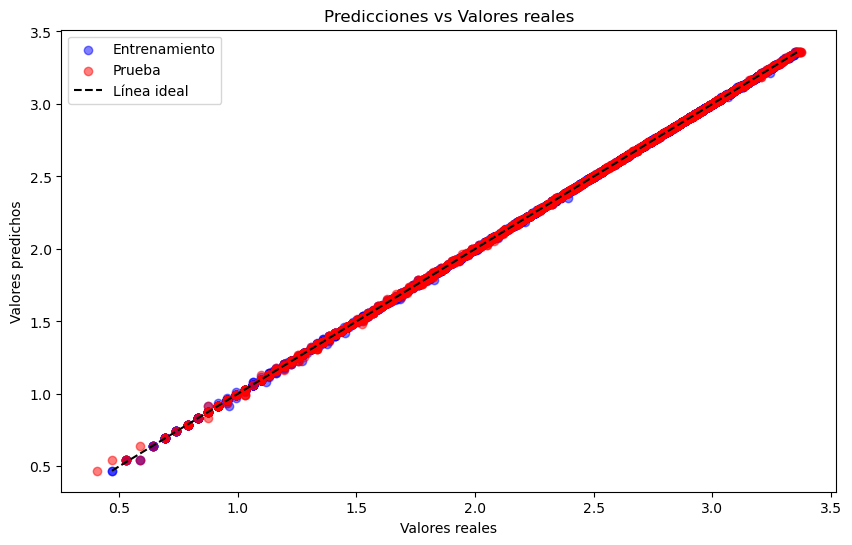

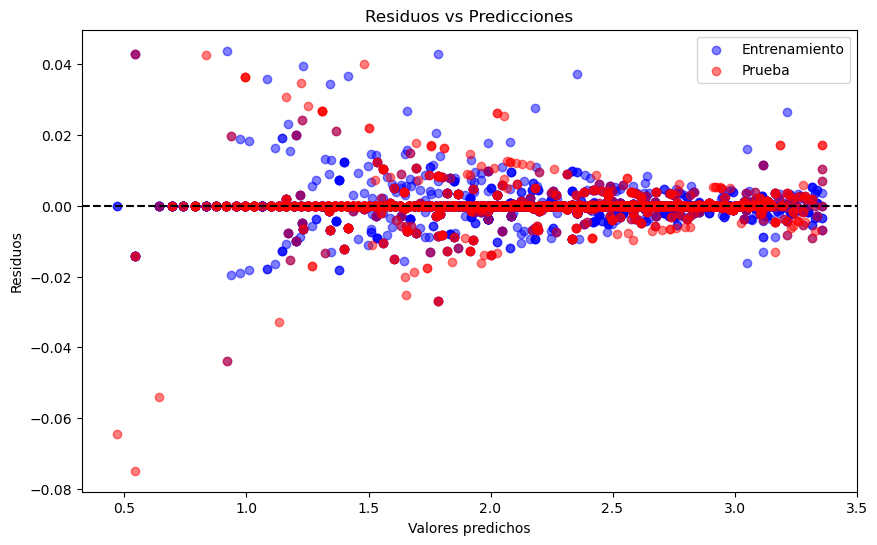

In [124]:
plt.figure(figsize=(10, 6))

plt.scatter(y_train, y_train_pred, color='blue', label='Entrenamiento', alpha=0.5)

plt.scatter(y_test, y_pred_dt, color='red', label='Prueba', alpha=0.5)

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='black', linestyle='--', label='Línea ideal')

plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.title('Predicciones vs Valores reales')

plt.legend()

plt.show()

residuos_train = y_train - y_train_pred
residuos_test = y_test - y_pred_dt

plt.figure(figsize=(10, 6))

plt.scatter(y_train_pred, residuos_train, color='blue', label='Entrenamiento', alpha=0.5)

plt.scatter(y_pred_dt, residuos_test, color='red', label='Prueba', alpha=0.5)

plt.axhline(0, color='black', linestyle='--')

plt.xlabel('Valores predichos')
plt.ylabel('Residuos')
plt.title('Residuos vs Predicciones')

plt.legend()

plt.show()

residuals = y_test - y_pred_dt  



In [125]:
dw_statistic = durbin_watson(residuos_test)

print(f"Estadístico de Durbin-Watson: {dw_statistic}")

Estadístico de Durbin-Watson: 1.961615811550052


Con base en los resultados obtenidos, podemos concluir que el modelo no presenta signos de overfitting. El valor del Estadístico de Durbin-Watson (1.96) sugiere que los residuos no presentan autocorrelación. Además, al comparar los resultados del conjunto de entrenamiento y el conjunto de prueba, no se observan diferencias significativas, lo que reafirma que el modelo generaliza bien y no está ajustado en exceso a los datos de entrenamiento.

La dispersión de los residuos indica que el modelo ha logrado capturar adecuadamente la variabilidad en los datos. Aunque la distribución de los residuos no pudo ser visualizada debido a limitaciones de memoria, los análisis previos muestran que los residuos están distribuidos de manera aleatoria, lo cual es indicativo de un modelo que funciona correctamente sin patrones significativos de error. 

Sin embargo, en caso de overfitting se debería de hacer uso de la poda.

¿Este modelo es mejor, peor o igual que los de regresión lineal simple y múltiple? Razona tu respuesta.

El modelo de árbol de decisión presenta un desempeño superior en comparación con los modelos de regresión lineal simple y regresión lineal múltiple en términos de las métricas evaluadas. A continuación, se analiza el rendimiento de cada modelo y su comparación:
- **MSE y RMSE:**
    - Un menor MSE y RMSE indica que el modelo de árbol de decisión tiene un mejor ajuste y menor error en las predicciones.
- **R²:**
    - Un valor de R² más cercano a 1 indica una mejor capacidad del modelo para explicar la variabilidad de los datos. El modelo de árbol de decisión, al tener el R² más alto, es el que mejor explica la variabilidad de los datos.
- **MAE:**
    - Un MAE más bajo significa que, en promedio, las predicciones del modelo de árbol de decisión están más cerca de los valores reales, lo cual es una indicación de mejor desempeño.

En conclusión, el modelo de árbol de decisión es mejor que los modelos de regresión lineal simple y múltiple en términos de MSE, RMSE, R² y MAE. 

**Comparativa**

En base al EDA realizado, a las decisiones tomadas sobre los datos e hiperparámetros y a las características computacionales de tu equipo. ¿Qué modelo obtiene mejores resultados de regresión?

En base al Análisis Exploratorio de Datos (EDA) realizado, las decisiones tomadas sobre los datos (como la preparación, limpieza y selección de características), y las características computacionales del equipo, se puede determinar qué el modelo de regresión obtiene los mejores resultados para el caso específico que estamos analizando. A continuación, explico los puntos clave para justificar la elección del modelo:

**Análisis Exploratorio de Datos (EDA)**
- Durante el EDA, se observaron patrones en los datos y se realizaron transformaciones, como la eliminación de valores atípicos, la normalización o estandarización, o la creación de variables derivadas que podrían haber afectado el rendimiento de los modelos.
- También se verificaron correlaciones entre las variables.

**Tratamiento de Datos**
- En el análisis se intentó agregar las características de Date y Time al conjunto de datos, con la idea de que estas podrían ayudar a capturar patrones adicionales. Sin embargo, al incorporar estas variables, se observó que el modelo no mejoraba y, de hecho, en algunos casos, empeoraba el rendimiento. Por lo tanto, se decidió no utilizar estas variables en el modelo final.
- En un principio, se intentó eliminar las columnas que contenían más del 60% de valores nulos (NaN), con la expectativa de reducir el ruido y mejorar la calidad del modelo. Sin embargo, esta estrategia aumentó el error del modelo, ya que se eliminaban columnas que, a pesar de tener un alto porcentaje de NaN, contenían información valiosa cuando se trataban adecuadamente. Por lo tanto, esta estrategia fue descartada.
- Para abordar el problema de las columnas con valores faltantes sin eliminar demasiada información, se decidió mantener los valores NaN y utilizar técnicas de imputación. 
- El uso del logaritmo mejoró el rendimiento del modelo en comparación con no usar la transformación logarítmica. Esto se debe a que la transformación logarítmica ayuda a manejar valores extremadamente altos o sesgados, mejorando así la precisión de las predicciones.
- Durante el proceso de preparación de los datos, se controlaron los outliers (valores atípicos) utilizando el método del rango intercuartílico (IQR). Este método ayuda a identificar y manejar los valores extremos, evitando que estos distorsionen el modelo. Se aplicó esta estrategia tanto durante la imputación de valores faltantes como durante la transformación logarítmica, asegurando que los datos estuvieran dentro de un rango razonable y sin valores extremos que pudieran afectar el rendimiento del modelo.

**Resultados y Comparación de Modelos**
- Basado en las métricas de desempeño (MSE, RMSE, R², MAE, RMSLE), el modelo de árbol de decisión ha demostrado ser el más preciso y eficiente:
    - MSE y RMSE más bajos que los modelos de regresión lineal, lo que sugiere que el árbol de decisión minimiza el error cuadrático de manera más efectiva.
    - R² más cercano a 1, lo que indica que el modelo de árbol de decisión explica mejor la variabilidad de los datos.
    - MAE más bajo, lo que implica que las predicciones del árbol de decisión son más precisas y menos dispersas.

A pesar de que la regresión lineal múltiple y la regresión lineal simple tienen un rendimiento bastante bueno, el modelo de árbol de decisión obtiene los mejores resultados en términos de todas las métricas clave. Esto se debe a su capacidad para capturar relaciones no lineales entre las variables, lo que lo hace más flexible y adecuado para este tipo de conjunto de datos.

## Investigación

Buscar un artículo científico (https://scholar.google.es/) con un caso de uso de regresión empleando una de las dos técnicas (o ambas) vistas en la actividad. Los artículos deben estar en revistas científicas, y deben ser posteriores a 2015. No debe utilizar técnicas de Deep Learning.

Cubiella, J., Castells, A., Andreu, M., Bujanda, L., Carballo, F., Jover, R., Lanas, Á., Morillas, J. D., Salas, D., & Quintero, E. (2016). Correlation between adenoma detection rate in colonoscopy‐ and fecal immunochemical testing‐based colorectal cancer screening programs. United European Gastroenterology Journal, 5(2), 255–260. https://doi.org/10.1177/2050640616660662

Objetivo: cuál es el objetivo de la investigación, es decir a qué problema real está aplicando la regresión. Técnicas de regresión empleadas y si realiza alguna adaptación. Principales resultados de la aplicación y de la investigación.

**Objetivo de la Investigación.**

El estudio investiga la correlación entre la tasa de detección de adenomas (ADR) en colonoscopias y los programas de detección de cáncer colorrectal basados en pruebas inmunoquímicas fecales (FIT).

**Técnicas de regresión empleadas.**

Utiliza regresión lineal múltiple para analizar los datos recopliados a lo largo del estudio.

**Resultados.**
- **Distribución Normal**: La ADR tuvo una distribución normal en ambos grupos de colonoscopia primaria y basada en FIT.
- **Correlación Positiva**: Se encontró una correlación positiva significativa entre la ADR en colonoscopias primarias y basadas en FIT (coeficiente de Pearson, 0.716; p < 0.001).
- **Modelo Predictivo**: El modelo de regresión lineal múltiple mostró que la ADR en colonoscopias basadas en FIT se relacionó de forma independiente con la ADR en el grupo de colonoscopia.
- **ADR Estimada**: La ADR estimada en colonoscopias basadas en FIT equivalente a una ADR del 20% en colonoscopias primarias fue del 45%.